In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

In [2]:
green_d=pd.read_csv("adani_green.csv")
green_d

,date,open,high,low,close,volume,sma5,sma10,sma15,sma20,...,fastd,fastksr,fastdsr,ULTOSC,WILLR,ATR,Trange,TYPPRICE,HT_DCPERIOD,BETA
0,2018-06-18 14:55:00+05:30,31.50,31.50,31.50,31.50,670,31.50,31.500,31.500000,31.5000,...,0.000000,0.000000,0.000000,8.000000,0.000000,0.174037,0.00,31.500000,18.265136,0.000000
1,2018-06-18 15:00:00+05:30,31.50,31.50,31.50,31.50,137,31.50,31.500,31.500000,31.5000,...,0.000000,100.000000,33.333333,7.619048,0.000000,0.161605,0.00,31.500000,18.279202,0.000000
2,2018-06-18 15:05:00+05:30,31.50,31.50,31.50,31.50,660,31.50,31.500,31.500000,31.5000,...,0.000000,100.000000,66.666667,8.067227,0.000000,0.150062,0.00,31.500000,18.317547,0.000000
3,2018-06-18 15:10:00+05:30,31.50,31.50,31.50,31.50,351,31.50,31.500,31.500000,31.5000,...,0.000000,0.000000,66.666667,7.142857,0.000000,0.139343,0.00,31.500000,18.371627,0.000000
4,2018-06-18 15:15:00+05:30,31.50,31.50,31.50,31.50,643,31.50,31.500,31.500000,31.5000,...,0.000000,0.000000,33.333333,7.453416,0.000000,0.129390,0.00,31.500000,18.434776,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67946,2022-02-18 15:05:00+05:30,2032.35,2038.20,2022.45,2028.00,30437,2028.82,2032.415,2042.600000,2048.3925,...,68.395803,77.210668,91.526739,44.822289,-62.316818,11.102892,15.75,2029.550000,26.263151,1.007192
67947,2022-02-18 15:10:00+05:30,2028.00,2043.15,2026.75,2041.55,29642,2032.79,2031.895,2040.526667,2047.2450,...,73.890362,100.000000,91.526739,52.748034,-41.146589,11.481257,16.40,2037.150000,25.371051,0.915766
67948,2022-02-18 15:15:00+05:30,2041.60,2057.95,2041.55,2053.10,51284,2037.56,2032.985,2039.466667,2046.5650,...,79.017465,100.000000,92.403556,59.476914,-19.722650,11.832596,16.40,2050.866667,24.576413,0.928791
67949,2022-02-18 15:20:00+05:30,2055.05,2059.00,2030.15,2039.50,48170,2038.86,2032.840,2037.820000,2045.3400,...,74.065802,59.477767,86.492589,51.829067,-33.620690,13.048125,28.85,2042.883333,24.050061,1.070777


In [3]:
green_d.columns

Index(['date', 'open', 'high', 'low', 'close', 'volume', 'sma5', 'sma10',
       'sma15', 'sma20', 'ema5', 'ema10', 'ema15', 'ema20', 'upperband',
       'middleband', 'lowerband', 'HT_TRENDLINE', 'KAMA10', 'KAMA20', 'KAMA30',
       'SAR', 'TRIMA5', 'TRIMA10', 'TRIMA20', 'ADX5', 'ADX10', 'ADX20', 'APO',
       'CCI5', 'CCI10', 'CCI15', 'macd510', 'macd520', 'macd1020', 'macd1520',
       'macd1226', 'MOM10', 'MOM15', 'MOM20', 'ROC5', 'ROC10', 'ROC20', 'PPO',
       'RSI14', 'RSI8', 'slowk', 'slowd', 'fastk', 'fastd', 'fastksr',
       'fastdsr', 'ULTOSC', 'WILLR', 'ATR', 'Trange', 'TYPPRICE',
       'HT_DCPERIOD', 'BETA'],
      dtype='object')

In [4]:
data=green_d.drop(['sma10','sma15','ema10', 'ema15','upperband',
       'middleband', 'lowerband', 'HT_TRENDLINE', 'KAMA10', 'KAMA20', 'KAMA30','TRIMA10', 'TRIMA20', 'ADX5', 'ADX10', 'ADX20', 'APO',
       'CCI5', 'CCI10', 'CCI15', 'macd510', 'macd520','macd1520',
       'macd1226', 'MOM10', 'MOM15', 'MOM20', 'ROC5', 'ROC10', 'ROC20', 'PPO',
       'RSI14',],axis='columns')
data

,date,open,high,low,close,volume,sma5,sma20,ema5,ema20,...,fastd,fastksr,fastdsr,ULTOSC,WILLR,ATR,Trange,TYPPRICE,HT_DCPERIOD,BETA
0,2018-06-18 14:55:00+05:30,31.50,31.50,31.50,31.50,670,31.50,31.5000,31.499909,31.442129,...,0.000000,0.000000,0.000000,8.000000,0.000000,0.174037,0.00,31.500000,18.265136,0.000000
1,2018-06-18 15:00:00+05:30,31.50,31.50,31.50,31.50,137,31.50,31.5000,31.499939,31.447641,...,0.000000,100.000000,33.333333,7.619048,0.000000,0.161605,0.00,31.500000,18.279202,0.000000
2,2018-06-18 15:05:00+05:30,31.50,31.50,31.50,31.50,660,31.50,31.5000,31.499959,31.452627,...,0.000000,100.000000,66.666667,8.067227,0.000000,0.150062,0.00,31.500000,18.317547,0.000000
3,2018-06-18 15:10:00+05:30,31.50,31.50,31.50,31.50,351,31.50,31.5000,31.499973,31.457139,...,0.000000,0.000000,66.666667,7.142857,0.000000,0.139343,0.00,31.500000,18.371627,0.000000
4,2018-06-18 15:15:00+05:30,31.50,31.50,31.50,31.50,643,31.50,31.5000,31.499982,31.461221,...,0.000000,0.000000,33.333333,7.453416,0.000000,0.129390,0.00,31.500000,18.434776,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67946,2022-02-18 15:05:00+05:30,2032.35,2038.20,2022.45,2028.00,30437,2028.82,2048.3925,2030.189194,2043.937432,...,68.395803,77.210668,91.526739,44.822289,-62.316818,11.102892,15.75,2029.550000,26.263151,1.007192
67947,2022-02-18 15:10:00+05:30,2028.00,2043.15,2026.75,2041.55,29642,2032.79,2047.2450,2033.976129,2043.710058,...,73.890362,100.000000,91.526739,52.748034,-41.146589,11.481257,16.40,2037.150000,25.371051,0.915766
67948,2022-02-18 15:15:00+05:30,2041.60,2057.95,2041.55,2053.10,51284,2037.56,2046.5650,2040.350753,2044.604338,...,79.017465,100.000000,92.403556,59.476914,-19.722650,11.832596,16.40,2050.866667,24.576413,0.928791
67949,2022-02-18 15:20:00+05:30,2055.05,2059.00,2030.15,2039.50,48170,2038.86,2045.3400,2040.067168,2044.118211,...,74.065802,59.477767,86.492589,51.829067,-33.620690,13.048125,28.85,2042.883333,24.050061,1.070777


In [5]:
data.columns

Index(['date', 'open', 'high', 'low', 'close', 'volume', 'sma5', 'sma20',
       'ema5', 'ema20', 'SAR', 'TRIMA5', 'macd1020', 'RSI8', 'slowk', 'slowd',
       'fastk', 'fastd', 'fastksr', 'fastdsr', 'ULTOSC', 'WILLR', 'ATR',
       'Trange', 'TYPPRICE', 'HT_DCPERIOD', 'BETA'],
      dtype='object')

In [6]:
data_green=data.drop(['slowk', 'slowd',
       'fastk', 'fastd', 'fastksr', 'fastdsr', 'ULTOSC', 'WILLR', 'ATR',
       'Trange', 'TYPPRICE', 'HT_DCPERIOD', 'BETA', 'SAR', 'TRIMA5'],axis='columns')
data_green.shape

(67951, 12)

In [7]:
data_green.columns

Index(['date', 'open', 'high', 'low', 'close', 'volume', 'sma5', 'sma20',
       'ema5', 'ema20', 'macd1020', 'RSI8'],
      dtype='object')

In [8]:
data_green

,date,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8
0,2018-06-18 14:55:00+05:30,31.50,31.50,31.50,31.50,670,31.50,31.5000,31.499909,31.442129,0.051655,57.622837
1,2018-06-18 15:00:00+05:30,31.50,31.50,31.50,31.50,137,31.50,31.5000,31.499939,31.447641,0.047273,57.622837
2,2018-06-18 15:05:00+05:30,31.50,31.50,31.50,31.50,660,31.50,31.5000,31.499959,31.452627,0.043212,57.622837
3,2018-06-18 15:10:00+05:30,31.50,31.50,31.50,31.50,351,31.50,31.5000,31.499973,31.457139,0.039456,57.622837
4,2018-06-18 15:15:00+05:30,31.50,31.50,31.50,31.50,643,31.50,31.5000,31.499982,31.461221,0.035993,57.622837
...,...,...,...,...,...,...,...,...,...,...,...,...
67946,2022-02-18 15:05:00+05:30,2032.35,2038.20,2022.45,2028.00,30437,2028.82,2048.3925,2030.189194,2043.937432,-9.210315,32.912726
67947,2022-02-18 15:10:00+05:30,2028.00,2043.15,2026.75,2041.55,29642,2032.79,2047.2450,2033.976129,2043.710058,-7.742417,51.908041
67948,2022-02-18 15:15:00+05:30,2041.60,2057.95,2041.55,2053.10,51284,2037.56,2046.5650,2040.350753,2044.604338,-5.521722,62.305345
67949,2022-02-18 15:20:00+05:30,2055.05,2059.00,2030.15,2039.50,48170,2038.86,2045.3400,2040.067168,2044.118211,-4.959707,48.263706


In [9]:
gdata_no_date=data_green.drop('date',axis='columns')
gdata_no_date

,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8
0,31.50,31.50,31.50,31.50,670,31.50,31.5000,31.499909,31.442129,0.051655,57.622837
1,31.50,31.50,31.50,31.50,137,31.50,31.5000,31.499939,31.447641,0.047273,57.622837
2,31.50,31.50,31.50,31.50,660,31.50,31.5000,31.499959,31.452627,0.043212,57.622837
3,31.50,31.50,31.50,31.50,351,31.50,31.5000,31.499973,31.457139,0.039456,57.622837
4,31.50,31.50,31.50,31.50,643,31.50,31.5000,31.499982,31.461221,0.035993,57.622837
...,...,...,...,...,...,...,...,...,...,...,...
67946,2032.35,2038.20,2022.45,2028.00,30437,2028.82,2048.3925,2030.189194,2043.937432,-9.210315,32.912726
67947,2028.00,2043.15,2026.75,2041.55,29642,2032.79,2047.2450,2033.976129,2043.710058,-7.742417,51.908041
67948,2041.60,2057.95,2041.55,2053.10,51284,2037.56,2046.5650,2040.350753,2044.604338,-5.521722,62.305345
67949,2055.05,2059.00,2030.15,2039.50,48170,2038.86,2045.3400,2040.067168,2044.118211,-4.959707,48.263706


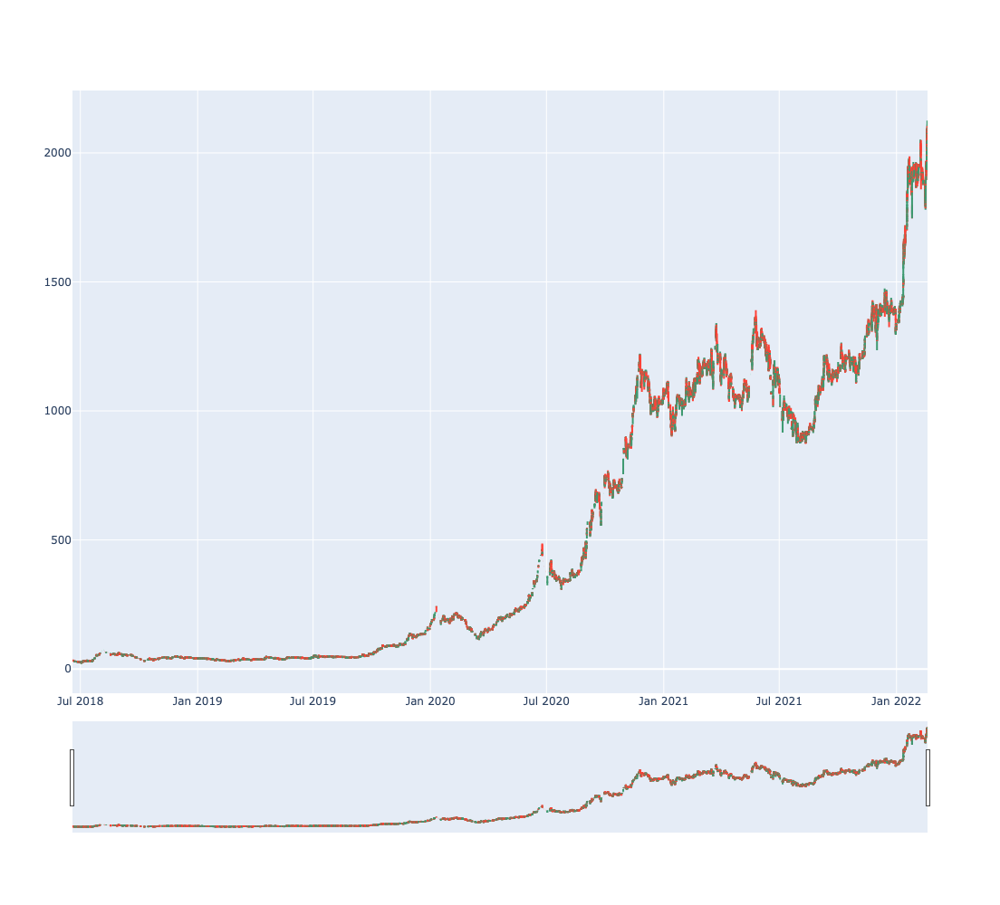

In [10]:
import plotly.graph_objects as go

figure=go.Figure(data=[go.Candlestick(x=data_green['date'],open=data_green['open'],high=data_green['high'],low=data_green['low'],
close=data_green['close'])])

figure.update_layout(
    width=1000,
    height=1000
)

figure.show()



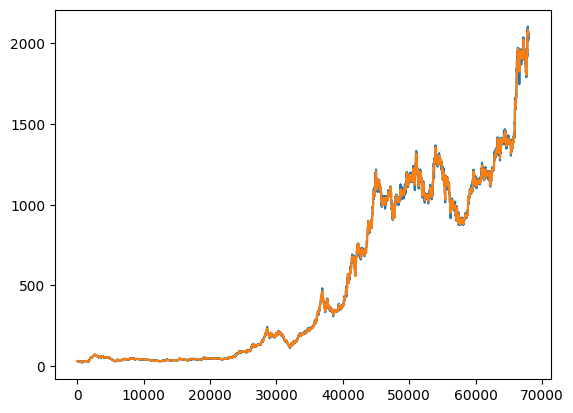

In [11]:
plt.plot(data_green['close'])
plt.plot(data_green['sma20'])


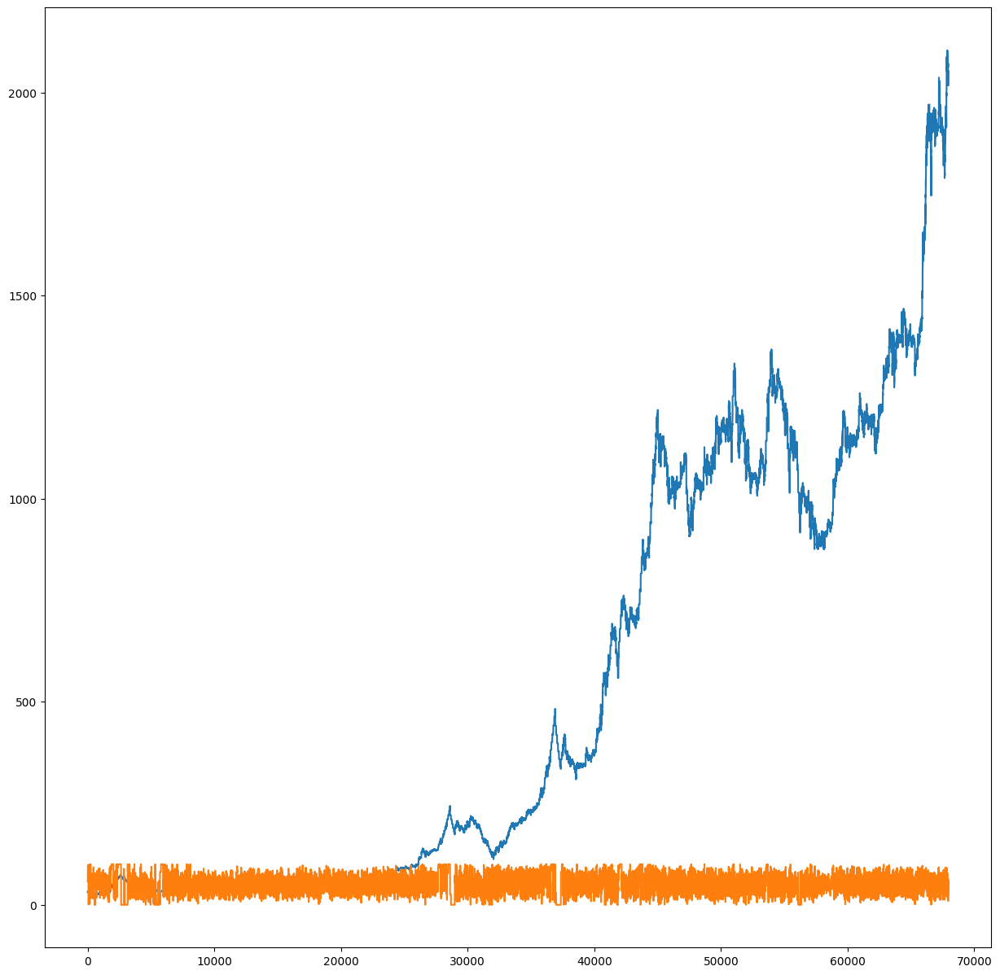

In [12]:
plt.figure(figsize=(15,15))
plt.plot(data_green['close'])
plt.plot(data_green['RSI8'])


plt.figure(figsize=(15,15))
plt.plot(data_green['macd1020'])

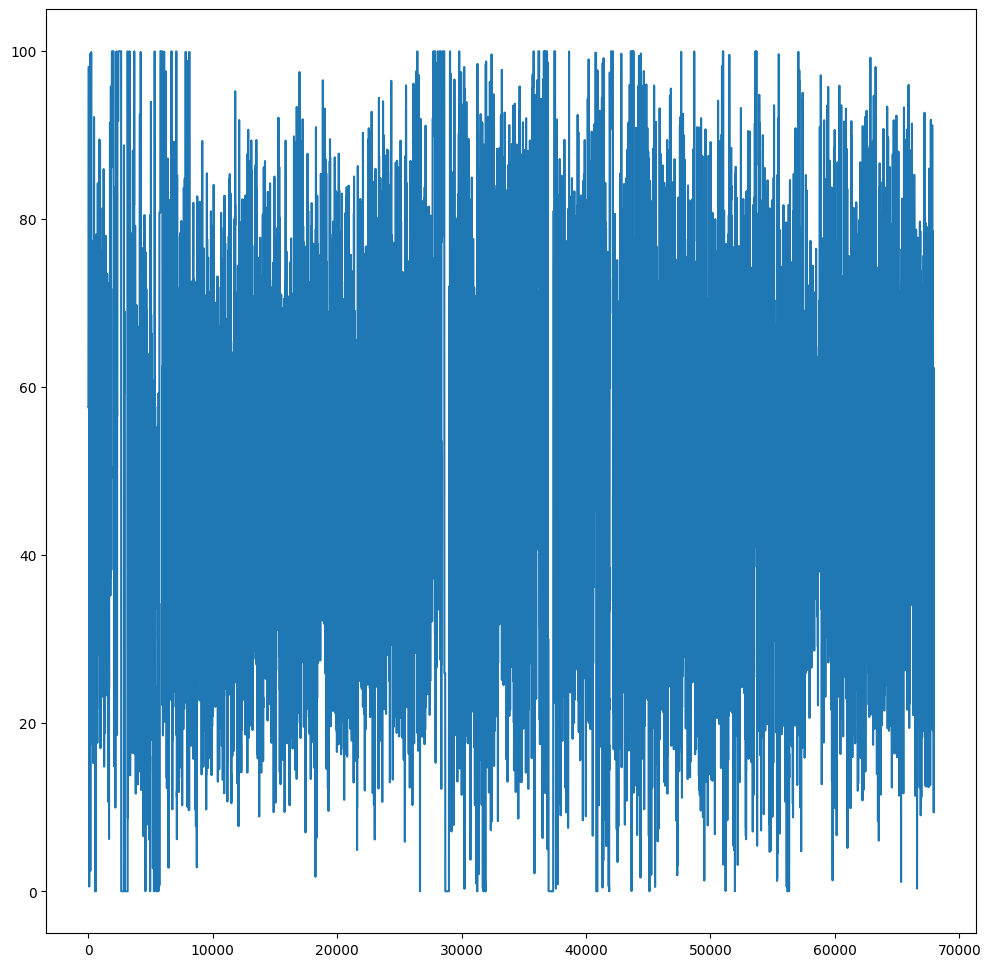

In [13]:
plt.figure(figsize=(12,12))
plt.plot(data_green["RSI8"])

In [14]:
splits = np.array_split(gdata_no_date, 10)

# Check the size of each part
for i, part in enumerate(splits):
    print(f"Part {i+1} size: {part.shape[0]}")

Part 1 size: 6796
Part 2 size: 6795
Part 3 size: 6795
Part 4 size: 6795
Part 5 size: 6795
Part 6 size: 6795
Part 7 size: 6795
Part 8 size: 6795
Part 9 size: 6795
Part 10 size: 6795


In [15]:
splits[0]

,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8
0,31.50,31.50,31.50,31.50,670,31.50,31.5000,31.499909,31.442129,0.051655,57.622837
1,31.50,31.50,31.50,31.50,137,31.50,31.5000,31.499939,31.447641,0.047273,57.622837
2,31.50,31.50,31.50,31.50,660,31.50,31.5000,31.499959,31.452627,0.043212,57.622837
3,31.50,31.50,31.50,31.50,351,31.50,31.5000,31.499973,31.457139,0.039456,57.622837
4,31.50,31.50,31.50,31.50,643,31.50,31.5000,31.499982,31.461221,0.035993,57.622837
...,...,...,...,...,...,...,...,...,...,...,...
6791,39.00,39.10,39.00,39.00,9383,38.99,38.1125,38.934547,38.414757,0.286376,69.796664
6792,39.00,39.15,38.85,38.85,14596,38.98,38.1875,38.906364,38.456209,0.271991,62.150519
6793,38.85,39.05,38.80,39.05,15940,38.98,38.2725,38.954243,38.512760,0.273949,67.564953
6794,39.05,39.05,39.00,39.00,23407,38.98,38.3550,38.969495,38.559164,0.266325,64.911879


In [16]:
from sklearn.preprocessing import StandardScaler
scaler1=StandardScaler()

xtrain1=splits[0].drop('close',axis='columns')
x_train1=scaler1.fit_transform(xtrain1)
x_train1=pd.DataFrame(x_train1,columns=xtrain1.columns)
x_train1=x_train1.drop(index=1000)
x_train1

,open,high,low,volume,sma5,sma20,ema5,ema20,macd1020,RSI8
0,-0.997347,-1.004850,-0.990351,-0.266144,-0.997297,-0.996771,-0.997385,-1.001554,0.188863,0.289265
1,-0.997347,-1.004850,-0.990351,-0.276778,-0.997297,-0.996771,-0.997383,-1.001134,0.171075,0.289265
2,-0.997347,-1.004850,-0.990351,-0.266344,-0.997297,-0.996771,-0.997381,-1.000753,0.154583,0.289265
3,-0.997347,-1.004850,-0.990351,-0.272509,-0.997297,-0.996771,-0.997380,-1.000409,0.139338,0.289265
4,-0.997347,-1.004850,-0.990351,-0.266683,-0.997297,-0.996771,-0.997380,-1.000098,0.125278,0.289265
...,...,...,...,...,...,...,...,...,...,...
6791,-0.425613,-0.425260,-0.418353,-0.092311,-0.426182,-0.492525,-0.430446,-0.469656,1.141832,0.728846
6792,-0.425613,-0.421447,-0.429793,0.011694,-0.426945,-0.486806,-0.432595,-0.466494,1.083428,0.452754
6793,-0.437048,-0.429073,-0.433606,0.038509,-0.426945,-0.480324,-0.428944,-0.462180,1.091376,0.648262
6794,-0.421801,-0.429073,-0.418353,0.187483,-0.426945,-0.474033,-0.427781,-0.458640,1.060424,0.552463


In [17]:
splits[1]['close']

6796     38.85
6797     38.80
6798     38.85
6799     38.85
6800     38.90
         ...  
13586    39.90
13587    39.80
13588    40.10
13589    40.05
13590    39.75
Name: close, Length: 6795, dtype: float64

In [18]:
ytrain1=splits[1]['close']
ytrain1=pd.DataFrame(ytrain1)
y_train1=scaler1.fit_transform(ytrain1)
y_train1=pd.DataFrame(y_train1,columns=ytrain1.columns)
y_train1

from sklearn.model_selection import train_test_split
xt1,xte1,yt1,yte1=train_test_split(x_train1,y_train1,test_size=0.2)

In [19]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso
l_model=LinearRegression()
l_model.fit(xt1,yt1)

LinearRegression()

In [20]:
l_model.score(xt1,yt1)

0.032744575913157936

In [21]:
y_pred=l_model.predict(xte1)
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [22]:
mse=mean_squared_error(yte1,y_pred)
mse

0.9703834487635677

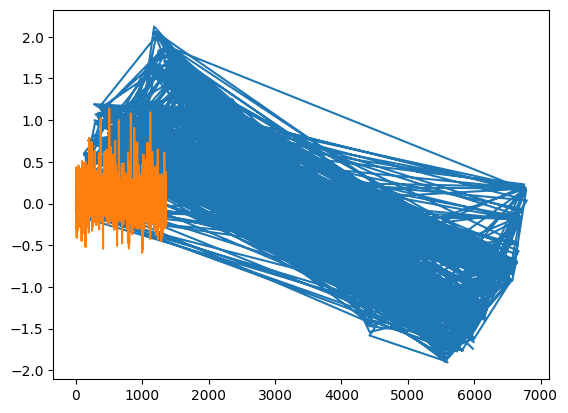

In [23]:
plt.plot(yte1)
plt.plot(y_pred)

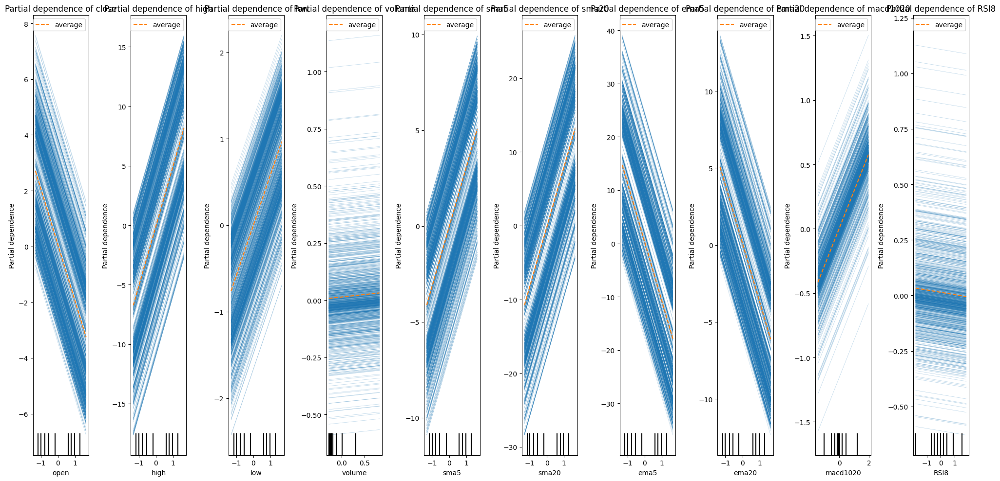

In [24]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Assuming 'linear_model' is your trained model and 'X_test' is your test dataset

feature_names = ["close", "high", "low", "volume", "sma5", "sma20","ema5","ema20","macd1020", "RSI8"]
feature_indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

fig, axs = plt.subplots(1, len(feature_indices), figsize=(20, 10))

for i, feature_index in enumerate(feature_indices):
    PartialDependenceDisplay.from_estimator(l_model, xte1, [feature_index], ax=axs[i], grid_resolution=100, kind='both')
    axs[i].set_title(f'Partial dependence of {feature_names[feature_index]}')
    axs[i].set_xlabel(feature_names[feature_index])
    axs[i].set_ylabel('Partial dependence')

plt.tight_layout()
plt.show()

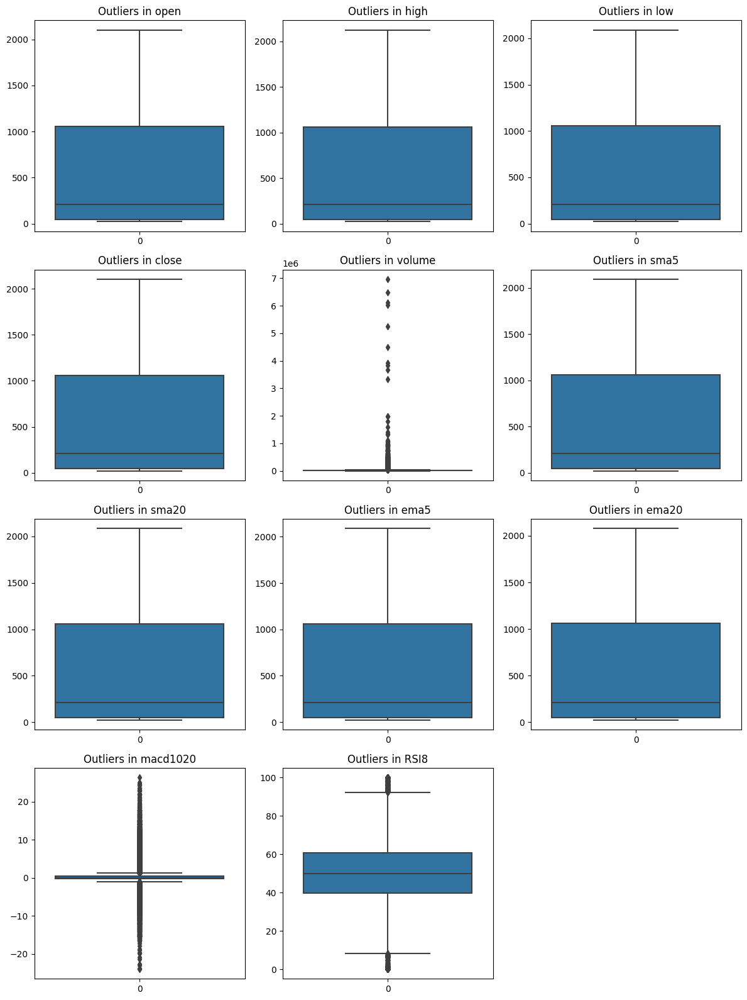

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming gdata_no_date is your DataFrame

# Calculate the number of rows and columns for subplots
num_columns = len(gdata_no_date.columns)
rows = (num_columns + 2) // 3  # Integer division with ceiling

# Create a figure and subplots grid
fig, axes = plt.subplots(rows, 3, figsize=(12, rows*4))  # Adjust figsize as needed

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Counter for iterating through columns and subplots
counter = 0

# Loop through each column in the DataFrame
for column in gdata_no_date.columns:
    # Check if we reached the end of axes (avoid IndexError)
    if counter >= len(axes):
        break

    # Use the counter to access the current subplot
    ax = axes[counter]

    # Create the boxplot on the current subplot and column
    sns.boxplot(data=gdata_no_date[column], ax=ax)

    # Set title for the subplot
    ax.set_title(f"Outliers in {column}")

    counter += 1

# Hide extra subplots if there are fewer columns than expected
for ax in axes[counter:]:
    ax.axis('off')  # Hide unused subplots

# Tighten layout to avoid overlapping elements
plt.tight_layout()

# Display the plot
plt.show()


In [44]:
tree0data=splits[0]
tree0data


,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8
0,31.50,31.50,31.50,31.50,670,31.50,31.5000,31.499909,31.442129,0.051655,57.622837
1,31.50,31.50,31.50,31.50,137,31.50,31.5000,31.499939,31.447641,0.047273,57.622837
2,31.50,31.50,31.50,31.50,660,31.50,31.5000,31.499959,31.452627,0.043212,57.622837
3,31.50,31.50,31.50,31.50,351,31.50,31.5000,31.499973,31.457139,0.039456,57.622837
4,31.50,31.50,31.50,31.50,643,31.50,31.5000,31.499982,31.461221,0.035993,57.622837
...,...,...,...,...,...,...,...,...,...,...,...
6791,39.00,39.10,39.00,39.00,9383,38.99,38.1125,38.934547,38.414757,0.286376,69.796664
6792,39.00,39.15,38.85,38.85,14596,38.98,38.1875,38.906364,38.456209,0.271991,62.150519
6793,38.85,39.05,38.80,39.05,15940,38.98,38.2725,38.954243,38.512760,0.273949,67.564953
6794,39.05,39.05,39.00,39.00,23407,38.98,38.3550,38.969495,38.559164,0.266325,64.911879


In [45]:
train1=splits[1]
train1close=train1['close']
train1close

6796     38.85
6797     38.80
6798     38.85
6799     38.85
6800     38.90
         ...  
13586    39.90
13587    39.80
13588    40.10
13589    40.05
13590    39.75
Name: close, Length: 6795, dtype: float64

In [49]:
#print(tree0data.head())
#print(train1close.head())

print(tree0data.index)
print(train1close.index)


RangeIndex(start=0, stop=6796, step=1)
RangeIndex(start=6796, stop=13591, step=1)


In [104]:
tree0data.reset_index(drop=True, inplace=True)
train1close.reset_index(drop=True, inplace=True)

tree0data['Close'] = train1close

tree0data.dropna(inplace=True)
tree0data

,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8,Close
0,31.50,31.50,31.50,31.50,670,31.50,31.5000,31.499909,31.442129,0.051655,57.622837,38.85
1,31.50,31.50,31.50,31.50,137,31.50,31.5000,31.499939,31.447641,0.047273,57.622837,38.80
2,31.50,31.50,31.50,31.50,660,31.50,31.5000,31.499959,31.452627,0.043212,57.622837,38.85
3,31.50,31.50,31.50,31.50,351,31.50,31.5000,31.499973,31.457139,0.039456,57.622837,38.85
4,31.50,31.50,31.50,31.50,643,31.50,31.5000,31.499982,31.461221,0.035993,57.622837,38.90
...,...,...,...,...,...,...,...,...,...,...,...,...
6790,39.00,39.10,38.90,39.00,8115,39.03,38.0300,38.901820,38.353153,0.281566,69.796664,39.90
6791,39.00,39.10,39.00,39.00,9383,38.99,38.1125,38.934547,38.414757,0.286376,69.796664,39.80
6792,39.00,39.15,38.85,38.85,14596,38.98,38.1875,38.906364,38.456209,0.271991,62.150519,40.10
6793,38.85,39.05,38.80,39.05,15940,38.98,38.2725,38.954243,38.512760,0.273949,67.564953,40.05


In [86]:
import tensorflow_decision_forests as tfdf

label='Close'
train_tree0=tfdf.keras.pd_dataframe_to_tf_dataset(tree0data,label=label,task=tfdf.keras.Task.REGRESSION)

In [87]:
train_tree0

<_PrefetchDataset element_spec=({'open': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'high': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'low': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'close': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'volume': TensorSpec(shape=(None,), dtype=tf.int64, name=None), 'sma5': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'sma20': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'ema5': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'ema20': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'macd1020': TensorSpec(shape=(None,), dtype=tf.float64, name=None), 'RSI8': TensorSpec(shape=(None,), dtype=tf.float64, name=None)}, TensorSpec(shape=(None,), dtype=tf.float64, name=None))>

In [88]:
rf=tfdf.keras.RandomForestModel(task=tfdf.keras.Task.REGRESSION)
rf.compile(metrics=["mse"])

Use /var/folders/gx/p5qhhh8s7rg2_ywh443qwth80000gn/T/tmpxf6aixi9 as temporary training directory


In [89]:
rf.fit(x=train_tree0)

Reading training dataset...


Training dataset read in 0:00:00.144099. Found 6795 examples.
Training model...


[INFO 24-07-14 08:33:32.8806 IST kernel.cc:1233] Loading model from path /var/folders/gx/p5qhhh8s7rg2_ywh443qwth80000gn/T/tmpxf6aixi9/model/ with prefix 2fc227c804bd46a0


Model trained in 0:00:01.547671
Compiling model...
Model compiled.


[INFO 24-07-14 08:33:33.4949 IST decision_forest.cc:734] Model loaded with 300 root(s), 507950 node(s), and 11 input feature(s).
[INFO 24-07-14 08:33:33.4950 IST abstract_model.cc:1344] Engine "RandomForestOptPred" built
[INFO 24-07-14 08:33:33.4950 IST kernel.cc:1061] Use fast generic engine


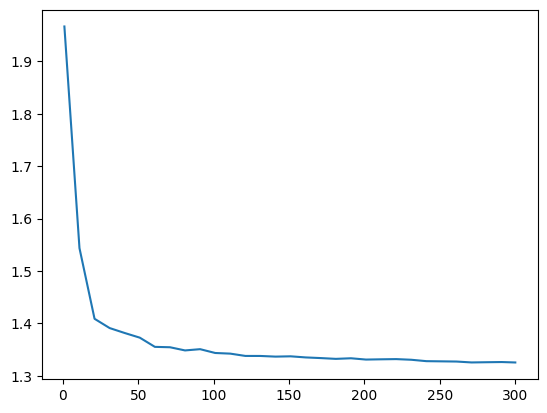

In [90]:
logs=rf.make_inspector().training_logs()
plt.plot([log.num_trees for log in logs],[log.evaluation.rmse for log in logs])

In [91]:
inspector=rf.make_inspector()
for v in inspector.variable_importances().keys():
    print(v)

INV_MEAN_MIN_DEPTH
NUM_AS_ROOT
SUM_SCORE
NUM_NODES


In [92]:
inspector.variable_importances()["SUM_SCORE"]

[("low" (1; #6), 7684920.833540367),
 ("high" (1; #5), 7341911.207387057),
 ("close" (1; #2), 6104173.344184205),
 ("open" (1; #8), 4452687.9331602845),
 ("sma5" (1; #10), 4053051.048825626),
 ("RSI8" (1; #0), 3943207.35425698),
 ("sma20" (1; #9), 3936646.178121015),
 ("macd1020" (1; #7), 3115441.5860249004),
 ("ema20" (1; #3), 2893046.2701174845),
 ("ema5" (1; #4), 2459614.0289998315),
 ("volume" (1; #11), 1935300.090622478)]

In [93]:
inspector.variable_importances()["NUM_AS_ROOT"]

[("low" (1; #6), 134.0),
 ("close" (1; #2), 48.0),
 ("sma20" (1; #9), 43.0),
 ("sma5" (1; #10), 42.0),
 ("open" (1; #8), 23.0),
 ("ema5" (1; #4), 6.0),
 ("high" (1; #5), 4.0)]

In [94]:
tree2data=splits[2]
tree2data

,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8
13591,39.75,39.75,39.60,39.70,25506,39.88,40.1175,39.845933,40.065010,-0.135005,36.991135
13592,39.70,39.95,39.65,39.70,49516,39.86,40.0875,39.797288,40.030247,-0.142061,36.991135
13593,39.70,39.75,39.50,39.65,69905,39.77,40.0450,39.748192,39.994033,-0.149154,35.261595
13594,40.20,40.30,39.80,40.00,35842,39.76,40.0225,39.832128,39.994601,-0.121518,52.884770
13595,40.00,40.00,39.80,39.80,15595,39.77,39.9875,39.821419,39.976068,-0.116273,44.902185
...,...,...,...,...,...,...,...,...,...,...,...
20381,50.10,50.20,50.00,50.00,17682,49.44,49.0100,49.585139,49.090575,0.234554,78.064706
20382,50.00,50.05,49.60,49.70,14211,49.57,49.0575,49.623426,49.148615,0.244672,64.717570
20383,49.70,49.75,49.65,49.75,5736,49.72,49.1025,49.665617,49.205890,0.252254,65.830363
20384,49.65,49.80,49.65,49.80,3101,49.87,49.1525,49.710412,49.262472,0.257828,67.019165


In [96]:
tree2_c=splits[3]
tree2closed=tree2_c['close']
tree2closed

20386     49.50
20387     49.50
20388     49.50
20389     49.50
20390     49.50
          ...  
27176    131.25
27177    131.55
27178    131.20
27179    132.80
27180    132.45
Name: close, Length: 6795, dtype: float64

In [98]:
tree2data.reset_index(drop=True, inplace=True)
tree2closed.reset_index(drop=True, inplace=True)

tree2data['Close'] = tree2closed

tree2data.dropna(inplace=True)

tree2data

,open,high,low,close,volume,sma5,sma20,ema5,ema20,macd1020,RSI8,Close
0,39.75,39.75,39.60,39.70,25506,39.88,40.1175,39.845933,40.065010,-0.135005,36.991135,49.50
1,39.70,39.95,39.65,39.70,49516,39.86,40.0875,39.797288,40.030247,-0.142061,36.991135,49.50
2,39.70,39.75,39.50,39.65,69905,39.77,40.0450,39.748192,39.994033,-0.149154,35.261595,49.50
3,40.20,40.30,39.80,40.00,35842,39.76,40.0225,39.832128,39.994601,-0.121518,52.884770,49.50
4,40.00,40.00,39.80,39.80,15595,39.77,39.9875,39.821419,39.976068,-0.116273,44.902185,49.50
...,...,...,...,...,...,...,...,...,...,...,...,...
6790,50.10,50.20,50.00,50.00,17682,49.44,49.0100,49.585139,49.090575,0.234554,78.064706,131.25
6791,50.00,50.05,49.60,49.70,14211,49.57,49.0575,49.623426,49.148615,0.244672,64.717570,131.55
6792,49.70,49.75,49.65,49.75,5736,49.72,49.1025,49.665617,49.205890,0.252254,65.830363,131.20
6793,49.65,49.80,49.65,49.80,3101,49.87,49.1525,49.710412,49.262472,0.257828,67.019165,132.80


In [99]:
label='Close'

train_tree2=tfdf.keras.pd_dataframe_to_tf_dataset(tree2data,label=label,task=tfdf.keras.Task.REGRESSION)

In [100]:
metrics=rf.evaluate(x=train_tree2)
print(metrics)

7/7 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - mse: 2396.3477
[0.0, 2396.34765625]


In [101]:
preds=rf.predict(x=train_tree2)
labels=tree2data['Close']

7/7 [==============================] - 0s 16ms/step


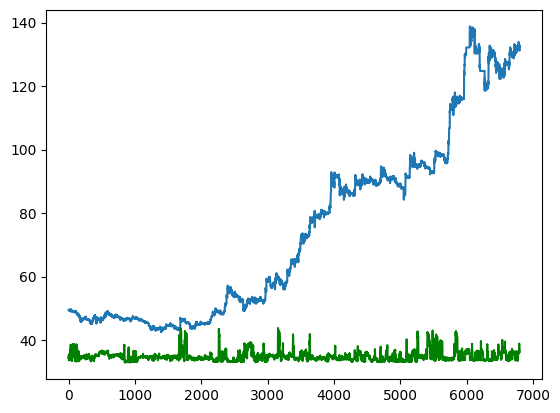

In [103]:
import matplotlib.pyplot as plt
plt.plot(labels)
plt.plot(preds,color='green')